<h1>BIT数据挖掘作业2—Wine Reviews<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#对数据集进行处理，转换成适合进行关联规则挖掘的形式" data-toc-modified-id="对数据集进行处理，转换成适合进行关联规则挖掘的形式-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>对数据集进行处理，转换成适合进行关联规则挖掘的形式</a></span><ul class="toc-item"><li><span><a href="#数据描述:" data-toc-modified-id="数据描述:-1.1"><span class="toc-item-num">1.1&nbsp;&nbsp;</span>数据描述:</a></span></li><li><span><a href="#加载并剔除重复数据" data-toc-modified-id="加载并剔除重复数据-1.2"><span class="toc-item-num">1.2&nbsp;&nbsp;</span>加载并剔除重复数据</a></span></li></ul></li><li><span><a href="#找出频繁模式" data-toc-modified-id="找出频繁模式-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>找出频繁模式</a></span><ul class="toc-item"><li><span><a href="#使用Apriori算法找出所有的频繁项集" data-toc-modified-id="使用Apriori算法找出所有的频繁项集-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>使用Apriori算法找出所有的频繁项集</a></span></li><li><span><a href="#使用FP-growth算法找出所有的频繁项集" data-toc-modified-id="使用FP-growth算法找出所有的频繁项集-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>使用FP-growth算法找出所有的频繁项集</a></span></li></ul></li><li><span><a href="#导出关联规则，计算支持度和置信度" data-toc-modified-id="导出关联规则，计算支持度和置信度-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>导出关联规则，计算支持度和置信度</a></span></li><li><span><a href="#对规则进行评价" data-toc-modified-id="对规则进行评价-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>对规则进行评价</a></span><ul class="toc-item"><li><span><a href="#使用Lift进行评价" data-toc-modified-id="使用Lift进行评价-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>使用Lift进行评价</a></span></li><li><span><a href="#使用Kulczynski-+-Imbalance-Ratio进行评价" data-toc-modified-id="使用Kulczynski-+-Imbalance-Ratio进行评价-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>使用Kulczynski + Imbalance Ratio进行评价</a></span></li></ul></li><li><span><a href="#可视化展示并分析" data-toc-modified-id="可视化展示并分析-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>可视化展示并分析</a></span></li></ul></div>

# 对数据集进行处理，转换成适合进行关联规则挖掘的形式

## 数据描述:
>**id:** 编号  
 **country:** 葡萄酒来源的国家  
 **description:** 葡萄酒描述  
 **designation:** 葡萄园名称  
 **points:** 葡萄酒评分  
 **price:** 葡萄酒价格  
 **province:** 葡萄酒来源的省或州  
 **region_1:** 葡萄酒产区  
 **region_2:** 葡萄酒具体产区  
 **variety:** 葡萄的品种   
 **winery:** 酿酒厂    
 **taster_name:** 品鉴师  
 **taster_twitter_handle:** 品鉴师推特      
 **title:** 品鉴师头衔   

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

import os
import math
import scipy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## 加载并剔除重复数据

In [2]:
def loadData(file_path, file_name):
    path = os.path.join(file_path, file_name)
    df = pd.read_csv(path)
    return df

In [3]:
file_path = 'D:/Dataset/DataMining/Wine Reviews'
file_name = 'winemag-data-130k-v2.csv'

#删除重复数据
wine_data_130k = loadData(file_path, file_name).drop('Unnamed: 0', axis=1).drop_duplicates()

print('wine_130k数据量为：', len(wine_data_130k))

display(wine_data_130k.head(5))

wine_130k数据量为： 119988


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian
4,US,"Much like the regular bottling from 2012, this...",Vintner's Reserve Wild Child Block,87,65.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Sweet Cheeks 2012 Vintner's Reserve Wild Child...,Pinot Noir,Sweet Cheeks


In [4]:
print('wine_130k的数据缺失情况为:')
print(wine_data_130k.isnull().sum())
for column in wine_data_130k.columns:
    idx = wine_data_130k[column].isnull()
    if idx.any():
        print('-' * 50, column, '-' * 50)
        display(wine_data_130k[idx].head(1))

wine_130k的数据缺失情况为:
country                     59
description                  0
designation              34545
points                       0
price                     8395
province                    59
region_1                 19560
region_2                 73219
taster_name              24917
taster_twitter_handle    29446
title                        0
variety                      1
winery                       0
dtype: int64
-------------------------------------------------- country --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
913,NaN,"Amber in color, this wine has aromas of peach ...",Asureti Valley,87,30.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Gotsa Family Wines 2014 Asureti Valley Chinuri,Chinuri,Gotsa Family Wines


-------------------------------------------------- designation --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
2,US,"Tart and snappy, the flavors of lime flesh and...",NaN,87,14.0,Oregon,Willamette Valley,Willamette Valley,Paul Gregutt,@paulgwine,Rainstorm 2013 Pinot Gris (Willamette Valley),Pinot Gris,Rainstorm


-------------------------------------------------- price --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia


-------------------------------------------------- province --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
913,NaN,"Amber in color, this wine has aromas of peach ...",Asureti Valley,87,30.0,NaN,NaN,NaN,Mike DeSimone,@worldwineguys,Gotsa Family Wines 2014 Asureti Valley Chinuri,Chinuri,Gotsa Family Wines


-------------------------------------------------- region_1 --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
1,Portugal,"This is ripe and fruity, a wine that is smooth...",Avidagos,87,15.0,Douro,NaN,NaN,Roger Voss,@vossroger,Quinta dos Avidagos 2011 Avidagos Red (Douro),Portuguese Red,Quinta dos Avidagos


-------------------------------------------------- region_2 --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
0,Italy,"Aromas include tropical fruit, broom, brimston...",Vulkà Bianco,87,NaN,Sicily & Sardinia,Etna,NaN,Kerin O’Keefe,@kerinokeefe,Nicosia 2013 Vulkà Bianco (Etna),White Blend,Nicosia


-------------------------------------------------- taster_name --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
31,Italy,Merlot and Nero d'Avola form the base for this...,Calanìca Nero d'Avola-Merlot,86,NaN,Sicily & Sardinia,Sicilia,NaN,NaN,NaN,Duca di Salaparuta 2010 Calanìca Nero d'Avola-...,Red Blend,Duca di Salaparuta


-------------------------------------------------- taster_twitter_handle --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
3,US,"Pineapple rind, lemon pith and orange blossom ...",Reserve Late Harvest,87,13.0,Michigan,Lake Michigan Shore,NaN,Alexander Peartree,NaN,St. Julian 2013 Reserve Late Harvest Riesling ...,Riesling,St. Julian


-------------------------------------------------- variety --------------------------------------------------


,country,description,designation,points,price,province,region_1,region_2,taster_name,taster_twitter_handle,title,variety,winery
86909,Chile,"A chalky, dusty mouthfeel nicely balances this...",NaN,88,17.0,Maipo Valley,NaN,NaN,NaN,NaN,Carmen 1999 (Maipo Valley),NaN,Carmen


> ***通过观察数据集各属性的缺失情况，应当选择具有代表性（属性间的冗余性低）且数据缺失较少的部分属性进行挖掘，在这里选择Country、points、price、province、taster_name、variety、winery 7个属性进行挖掘***

In [5]:
# 选择数据集中的Country、points、price、province、taster_name、variety、winery属性，构成新的数据集
mine_col = ['country', 'points', 'price', 'province', 'variety', 'winery', 'taster_name']
mine_col_nominal = ['country', 'province', 'variety', 'winery', 'taster_name']
mine_col_numeric = ['points', 'price']

wine_data_130k_sub = wine_data_130k[mine_col]
wine_data_130k_sub.head(5)

,country,points,price,province,variety,winery,taster_name
0,Italy,87,NaN,Sicily & Sardinia,White Blend,Nicosia,Kerin O’Keefe
1,Portugal,87,15.0,Douro,Portuguese Red,Quinta dos Avidagos,Roger Voss
2,US,87,14.0,Oregon,Pinot Gris,Rainstorm,Paul Gregutt
3,US,87,13.0,Michigan,Riesling,St. Julian,Alexander Peartree
4,US,87,65.0,Oregon,Pinot Noir,Sweet Cheeks,Paul Gregutt


> ***频繁模式和关联规则的挖掘应当尽量来自于真实数据。由于缺失较多，且不恰当的填补缺失值方式会影响数据集的真实分布，这里选择剔除缺失的数据。***

In [6]:
# 剔除缺失的数据
wine_data_130k_new = wine_data_130k_sub.dropna()
print('剔除缺失数据后wine_130k的数据量为：', len(wine_data_130k_new))
wine_data_130k_new.head(5)

剔除缺失数据后wine_130k的数据量为： 88265


,country,points,price,province,variety,winery,taster_name
1,Portugal,87,15.0,Douro,Portuguese Red,Quinta dos Avidagos,Roger Voss
2,US,87,14.0,Oregon,Pinot Gris,Rainstorm,Paul Gregutt
3,US,87,13.0,Michigan,Riesling,St. Julian,Alexander Peartree
4,US,87,65.0,Oregon,Pinot Noir,Sweet Cheeks,Paul Gregutt
5,Spain,87,15.0,Northern Spain,Tempranillo-Merlot,Tandem,Michael Schachner


> ***针对标称属性，这里不做处理。针对数值属性，尤其是针对价格、评分这类取值较多但一定区间内具有相似性的属性，这里选择使用区间划分进行离散化处理。***

In [7]:
# 观察Points、Price的五数概括
def calStaticalFeature(df, columns):
    df_desc = df[columns].describe()
    display(df_desc)

calStaticalFeature(wine_data_130k_new, mine_col_numeric)

,points,price
count,88265.000000,88265.000000
mean,88.581386,35.293842
std,3.008537,44.405889
min,80.000000,4.000000
25%,87.000000,17.000000
50%,88.000000,25.000000
75%,91.000000,42.000000
max,100.000000,3300.000000


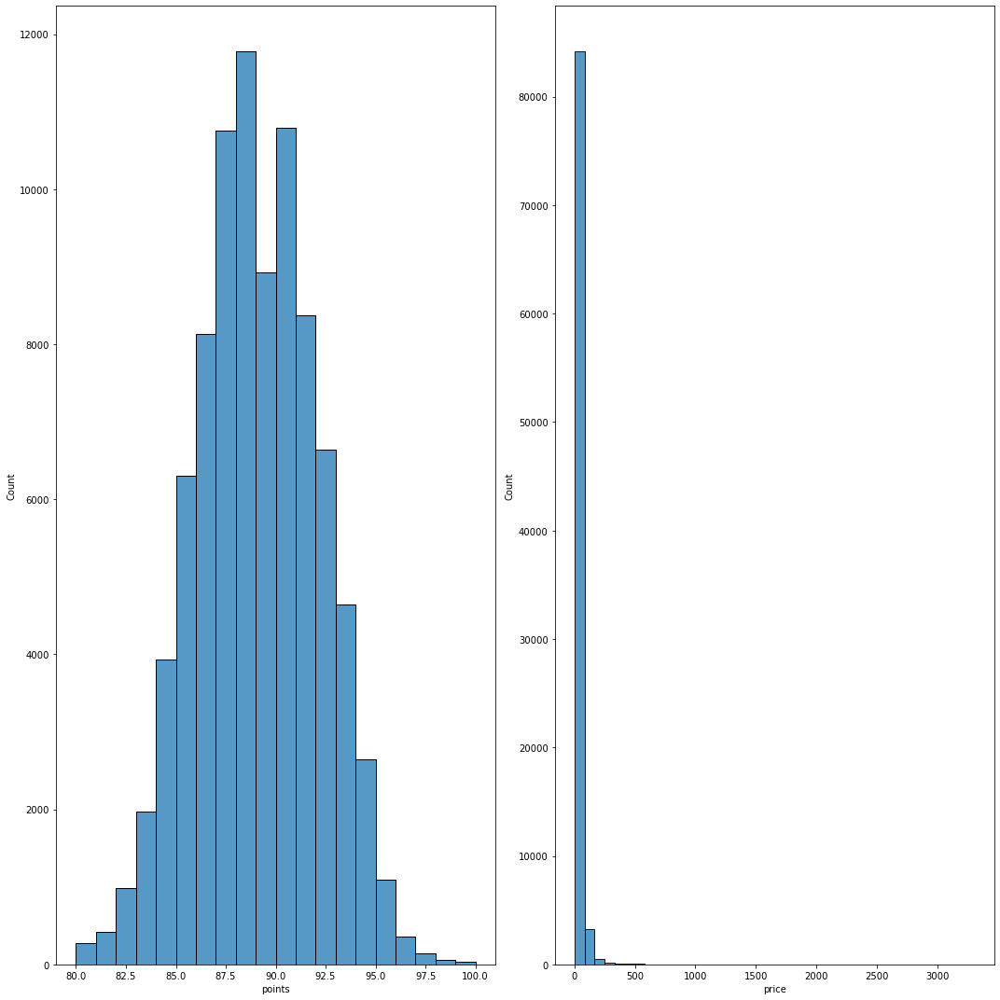

In [8]:
# 观察Points、Price的数据分布情况
def drawHistogramForNumerical(df, columns, figsize=(15, 15), bins=[20, 40]):
    fig, ax = plt.subplots(1, 2, figsize=figsize)
    for idx, column in enumerate(columns):
        sns.histplot(data=df[column], ax=ax[idx % 2], bins=bins[idx])
    fig.tight_layout()
    
drawHistogramForNumerical(wine_data_130k_new, mine_col_numeric)

> ***观察上述结果，决定将Points大致划分为4个区间，分别对应低分（0-85），中低分（85-89）,中高分（89-93），高分（93-100）***     
 ***Price大致划分为3个区间，分别对应低价（0-25）,中价（25-60），高价（60-3500）***  
 ***处理后的结果如下：***  

In [9]:
points_bin = [0., 85., 89., 93., 100.]
price_bin = [0., 25., 60., 3500.]
wine_data_130k_new['points'] = pd.cut(wine_data_130k_new['points'], points_bin).astype('str')
wine_data_130k_new['price'] = pd.cut(wine_data_130k_new['price'], price_bin).astype('str')
wine_data_130k_new.head(5)

,country,points,price,province,variety,winery,taster_name
1,Portugal,"(85.0, 89.0]","(0.0, 25.0]",Douro,Portuguese Red,Quinta dos Avidagos,Roger Voss
2,US,"(85.0, 89.0]","(0.0, 25.0]",Oregon,Pinot Gris,Rainstorm,Paul Gregutt
3,US,"(85.0, 89.0]","(0.0, 25.0]",Michigan,Riesling,St. Julian,Alexander Peartree
4,US,"(85.0, 89.0]","(60.0, 3500.0]",Oregon,Pinot Noir,Sweet Cheeks,Paul Gregutt
5,Spain,"(85.0, 89.0]","(0.0, 25.0]",Northern Spain,Tempranillo-Merlot,Tandem,Michael Schachner


In [12]:
# 为每个值添加上对应的列名前缀，方便分析
for column in wine_data_130k_new.columns:
    wine_data_130k_new[column] = str(column) + ': ' + wine_data_130k_new[column].astype(str)

wine_data_130k_new.head(5)

,country,points,price,province,variety,winery,taster_name
1,country: Portugal,"points: (85.0, 89.0]","price: (0.0, 25.0]",province: Douro,variety: Portuguese Red,winery: Quinta dos Avidagos,taster_name: Roger Voss
2,country: US,"points: (85.0, 89.0]","price: (0.0, 25.0]",province: Oregon,variety: Pinot Gris,winery: Rainstorm,taster_name: Paul Gregutt
3,country: US,"points: (85.0, 89.0]","price: (0.0, 25.0]",province: Michigan,variety: Riesling,winery: St. Julian,taster_name: Alexander Peartree
4,country: US,"points: (85.0, 89.0]","price: (60.0, 3500.0]",province: Oregon,variety: Pinot Noir,winery: Sweet Cheeks,taster_name: Paul Gregutt
5,country: Spain,"points: (85.0, 89.0]","price: (0.0, 25.0]",province: Northern Spain,variety: Tempranillo-Merlot,winery: Tandem,taster_name: Michael Schachner


# 找出频繁模式

## 使用Apriori算法找出所有的频繁项集

In [13]:
def createC1(dataSet):
    C1 = []
    for transaction in np.array(dataSet):
        for item in transaction:
            if [item] not in C1:
                C1.append([item])
    C1.sort()
    return list(map(frozenset, C1))

def scanD(D, Ck, minSupport):
    ssCnt = {}
    for tid in D:
        if Ck is not None:
            for can in Ck:
                if can.issubset(tid):
                    ssCnt[can] = ssCnt.get(can, 0) + 1
    numItems = float(len(D))
    retList = []
    supportData = {}
    for key in ssCnt:
        support = ssCnt[key] / numItems
        if support >= minSupport:
            retList.insert(0, key)
            supportData[key] = support
    return retList, supportData

In [14]:
def aprioriGen( Lk, k ):
    retList = []
    lenLk = len(Lk)
    for i in range(lenLk):
        for j in range(i + 1, lenLk):
            L1 = list(Lk[ i ])[: k - 2];
            L2 = list(Lk[ j ])[: k - 2];
            L1.sort(); L2.sort()    
            if L1==L2:
                retList.append(Lk[i] | Lk[j]) 
    return retList

def apriori(dataSet, minSupport=0.01):
    C1 = createC1(dataSet)
    D =list(map(set, dataSet))
    L1, suppData = scanD(D, C1, minSupport)
    L = [L1]
    k = 2
    
    while (len(L[k - 2] ) > 0):
        Ck = aprioriGen(L[k - 2], k)
        Lk, supK = scanD(D, Ck, minSupport)
        suppData.update(supK)
        L.append(Lk)
        k += 1
    return L, suppData

In [15]:
L, suppData = apriori(wine_data_130k_new.values.tolist())
L

[[frozenset({'province: Loire Valley'}),
  frozenset({'variety: Tempranillo'}),
  frozenset({'province: Veneto'}),
  frozenset({'variety: Nebbiolo'}),
  frozenset({'province: Piedmont'}),
  frozenset({'points: (93.0, 100.0]'}),
  frozenset({'variety: Sparkling Blend'}),
  frozenset({'province: Provence'}),
  frozenset({'province: Catalonia'}),
  frozenset({'taster_name: Susan Kostrzewa'}),
  frozenset({'province: Rhône Valley'}),
  frozenset({'province: Northeastern Italy'}),
  frozenset({'taster_name: Lauren Buzzeo'}),
  frozenset({'country: New Zealand'}),
  frozenset({'province: Southwest France'}),
  frozenset({'variety: Portuguese White'}),
  frozenset({'variety: Rhône-style Red Blend'}),
  frozenset({'country: South Africa'}),
  frozenset({'points: (89.0, 93.0]'}),
  frozenset({'variety: Syrah'}),
  frozenset({'province: New York'}),
  frozenset({'variety: Grüner Veltliner'}),
  frozenset({'taster_name: Anne Krebiehl\xa0MW'}),
  frozenset({'country: Austria'}),
  frozenset({'prov

# 导出关联规则，计算支持度和置信度

In [16]:
# 关联规则生成函数
def generateRules(L, supportData, minConf=0.5):
    bigRuleList = []
    for i in range(1, len(L)):
        for freqSet in L[i]:
            H1 = [frozenset([item]) for item in freqSet]
            if (i > 1):
                rulesFromConseq(freqSet, H1, supportData, bigRuleList, minConf)
            else:
                calcConf(freqSet, H1, supportData, bigRuleList, minConf)
    return bigRuleList


def calcConf(freqSet, H, supportData, brl, minConf=0.5):
    prunedH = []
    for conseq in H:
        conf = supportData[freqSet]/supportData[freqSet-conseq]
        if conf >= minConf:
            print(f'{freqSet-conseq} --> {conseq} conf:{conf}'+ ' support: '+ str(supportData[freqSet]))
            brl.append((freqSet-conseq, conseq, conf, supportData[freqSet]))
            prunedH.append(conseq)
    return prunedH


def rulesFromConseq(freqSet, H, supportData, brl, minConf=0.5):
    m = len(H[0])
    if (len(freqSet) > (m + 1)):
        Hmp1 = aprioriGen(H, m+1)
        Hmp1 = calcConf(freqSet, Hmp1, supportData, brl, minConf)
        if (len(Hmp1) > 1):
            rulesFromConseq(freqSet, Hmp1, supportData, brl, minConf)

In [17]:
rules = generateRules(L, suppData)

frozenset({'taster_name: Anne Krebiehl\xa0MW'}) --> frozenset({'points: (89.0, 93.0]'}) conf:0.5449141347424042 support: 0.018693706452161105
frozenset({'province: Veneto'}) --> frozenset({'taster_name: Kerin O’Keefe'}) conf:0.9600420609884333 support: 0.010343850903529146
frozenset({'province: Loire Valley'}) --> frozenset({'price: (0.0, 25.0]'}) conf:0.6434054431263085 support: 0.010445816575086388
frozenset({'province: Loire Valley'}) --> frozenset({'taster_name: Roger Voss'}) conf:1.0 support: 0.01623520081572537
frozenset({'province: Loire Valley'}) --> frozenset({'country: France'}) conf:1.0 support: 0.01623520081572537
frozenset({'variety: Tempranillo'}) --> frozenset({'price: (0.0, 25.0]'}) conf:0.5842204132748904 support: 0.010570441284767461
frozenset({'variety: Tempranillo'}) --> frozenset({'country: Spain'}) conf:0.8058860363180964 support: 0.014581091032685662
frozenset({'variety: Tempranillo'}) --> frozenset({'province: Northern Spain'}) conf:0.678146524733876 support: 0.

In [18]:
print(rules[0])

(frozenset({'taster_name: Anne Krebiehl\xa0MW'}), frozenset({'points: (89.0, 93.0]'}), 0.5449141347424042, 0.018693706452161105)


# 对规则进行评价

## 使用Lift进行评价

In [19]:
def getLifts(rules, suppData):
    lift = []
    for rule in rules:
        freqSet_conseq = rule[0]
        conseq = rule[1]
        lift_val = float(rule[3]) / float(suppData[conseq])
        lift.append([freqSet_conseq, conseq, lift_val])
    return lift

def showLifts(lifts):
    for lift in lifts:
        print(f'{lift[0]} --> {lift[1]} lift value:{lift[2]}')

In [20]:
lifts = getLifts(rules, suppData)
showLifts(lifts)

frozenset({'taster_name: Anne Krebiehl\xa0MW'}) --> frozenset({'points: (89.0, 93.0]'}) lift value:0.05419787150177375
frozenset({'province: Veneto'}) --> frozenset({'taster_name: Kerin O’Keefe'}) lift value:0.10275745638716939
frozenset({'province: Loire Valley'}) --> frozenset({'price: (0.0, 25.0]'}) lift value:0.02004565713664529
frozenset({'province: Loire Valley'}) --> frozenset({'taster_name: Roger Voss'}) lift value:0.07727983605673298
frozenset({'province: Loire Valley'}) --> frozenset({'country: France'}) lift value:0.08933358269434574
frozenset({'variety: Tempranillo'}) --> frozenset({'price: (0.0, 25.0]'}) lift value:0.020284813566692032
frozenset({'variety: Tempranillo'}) --> frozenset({'country: Spain'}) lift value:0.21503759398496242
frozenset({'variety: Tempranillo'}) --> frozenset({'province: Northern Spain'}) lift value:0.3116546762589928
frozenset({'variety: Tempranillo'}) --> frozenset({'taster_name: Michael Schachner'}) lift value:0.09441719561454126
frozenset({'var

## 使用Kulczynski + Imbalance Ratio进行评价

In [21]:
def getKulcAndIr(rules, suppData):
    kulcWithIrs = []
    for rule in rules:
        freqSet_conseq = rule[0]
        conseq = rule[1]
        sA = float(suppData[freqSet_conseq])
        sB = float(suppData[conseq])
        sAB = float(rule[3])
        kulc_val = (sAB / sA + sAB / sB) / 2.
        ir_val = (abs(sA - sB) / (sA + sB - sAB))
        kulcWithIrs.append([freqSet_conseq, conseq, kulc_val, ir_val])
        
    return kulcWithIrs

def showKulcAndIr(kwis):
    for kwi in kwis:
        print(f'{kwi[0]} --> {kwi[1]} Kulczynski:{kwi[2]} Imbalance Ratio:{kwi[3]}')

In [22]:
kulcWithIrs = getKulcAndIr(rules, suppData)
showKulcAndIr(kulcWithIrs)

frozenset({'taster_name: Anne Krebiehl\xa0MW'}) --> frozenset({'points: (89.0, 93.0]'}) Kulczynski:0.299556003122089 Imbalance Ratio:0.8615423292062095
frozenset({'province: Veneto'}) --> frozenset({'taster_name: Kerin O’Keefe'}) Kulczynski:0.5313997586878013 Imbalance Ratio:0.889162837610669
frozenset({'province: Loire Valley'}) --> frozenset({'price: (0.0, 25.0]'}) Kulczynski:0.3317255501314769 Imbalance Ratio:0.9581989420719906
frozenset({'province: Loire Valley'}) --> frozenset({'taster_name: Roger Voss'}) Kulczynski:0.5386399180283665 Imbalance Ratio:0.922720163943267
frozenset({'province: Loire Valley'}) --> frozenset({'country: France'}) Kulczynski:0.5446667913471729 Imbalance Ratio:0.9106664173056542
frozenset({'variety: Tempranillo'}) --> frozenset({'price: (0.0, 25.0]'}) Kulczynski:0.3022526134207912 Imbalance Ratio:0.9515420390492725
frozenset({'variety: Tempranillo'}) --> frozenset({'country: Spain'}) Kulczynski:0.5104618151515294 Imbalance Ratio:0.6970611596505162
frozense

frozenset({'taster_name: Paul Gregutt', 'province: Oregon'}) --> frozenset({'variety: Pinot Noir', 'country: US'}) Kulczynski:0.4570915961913452 Imbalance Ratio:0.20545220545220544
frozenset({'province: Oregon'}) --> frozenset({'taster_name: Paul Gregutt', 'variety: Pinot Noir', 'country: US'}) Kulczynski:0.748230593236827 Imbalance Ratio:0.4942787086228035
frozenset({'province: Oregon', 'price: (0.0, 25.0]'}) --> frozenset({'points: (85.0, 89.0]', 'country: US'}) Kulczynski:0.31049872611799956 Imbalance Ratio:0.8289900168546611
frozenset({'taster_name: Paul Gregutt', 'points: (85.0, 89.0]'}) --> frozenset({'price: (0.0, 25.0]', 'country: US'}) Kulczynski:0.3359699090589432 Imbalance Ratio:0.6388420096066467
frozenset({'taster_name: Paul Gregutt', 'price: (0.0, 25.0]'}) --> frozenset({'points: (85.0, 89.0]', 'country: US'}) Kulczynski:0.3356221323134655 Imbalance Ratio:0.6673197012366842
frozenset({'province: Oregon', 'price: (0.0, 25.0]'}) --> frozenset({'taster_name: Paul Gregutt', '

# 可视化展示并分析

In [23]:
# 将满足条件的关联规则对应的支持度、信任度、Lift值、Kulczynski及Imbalance Ratio合并在一起并转成Dataframe对象
itemSet_list = []
for i in range(len(rules)):
    tA = str(list(map(lambda x: x, rules[i][0])))
    tB = str(list(map(lambda x: x, rules[i][1])))
    tAB = tA + '-->' + tB
    sA, sB, sAB = float(suppData[rules[i][0]]), float(suppData[rules[i][1]]), float(rules[i][3])
    cAB = sAB / sA
    lift = lifts[i][-1]
    kulc, ir = kulcWithIrs[i][-2], kulcWithIrs[i][-1]
    
    itemSet_list.append([tA, tB, tAB, sA, sB, sAB, cAB, lift, kulc, ir])

itemSet = pd.DataFrame(data=itemSet_list, columns=['rule_A', 'rule_B', 'rule','Support_A', 'Support_B', 'Support_AB', 'Confidence', 'Lift', 'Kulczynski', 'Imbalance_Ratio'])
display(itemSet)

,rule_A,rule_B,rule,Support_A,Support_B,Support_AB,Confidence,Lift,Kulczynski,Imbalance_Ratio
0,['taster_name: Anne Krebiehl\xa0MW'],"['points: (89.0, 93.0]']",['taster_name: Anne Krebiehl\xa0MW']-->['point...,0.034306,0.344916,0.018694,0.544914,0.054198,0.299556,0.861542
1,['province: Veneto'],['taster_name: Kerin O’Keefe'],['province: Veneto']-->['taster_name: Kerin O’...,0.010774,0.100663,0.010344,0.960042,0.102757,0.531400,0.889163
2,['province: Loire Valley'],"['price: (0.0, 25.0]']","['province: Loire Valley']-->['price: (0.0, 25...",0.016235,0.521101,0.010446,0.643405,0.020046,0.331726,0.958199
3,['province: Loire Valley'],['taster_name: Roger Voss'],['province: Loire Valley']-->['taster_name: Ro...,0.016235,0.210083,0.016235,1.000000,0.077280,0.538640,0.922720
4,['province: Loire Valley'],['country: France'],['province: Loire Valley']-->['country: France'],0.016235,0.181737,0.016235,1.000000,0.089334,0.544667,0.910666
...,...,...,...,...,...,...,...,...,...,...
787,"['variety: Bordeaux-style Red Blend', 'price: ...","['province: Bordeaux', 'taster_name: Roger Vos...","['variety: Bordeaux-style Red Blend', 'price: ...",0.020710,0.019566,0.011137,0.537746,0.569195,0.553471,0.039269
788,"['province: Bordeaux', 'price: (0.0, 25.0]', '...","['variety: Bordeaux-style Red Blend', 'country...","['province: Bordeaux', 'price: (0.0, 25.0]', '...",0.015046,0.033162,0.011137,0.740211,0.335839,0.538025,0.488692
789,"['province: Bordeaux', 'variety: Bordeaux-styl...","['country: France', 'points: (85.0, 89.0]', 't...","['province: Bordeaux', 'variety: Bordeaux-styl...",0.019940,0.064986,0.011137,0.558523,0.171374,0.364948,0.610471
790,"['variety: Bordeaux-style Red Blend', 'points:...","['province: Bordeaux', 'price: (0.0, 25.0]', '...","['variety: Bordeaux-style Red Blend', 'points:...",0.021401,0.027089,0.011137,0.520381,0.411125,0.465753,0.152260


In [38]:
def drawBarPlot(df, columns, column_x, column_y, sortedby, nums=30, fig_size=(20, 30)):
    plt.figure(figsize=fig_size)
    sns.set_theme(font_scale=2, palette=sns.color_palette('Oranges_r'))
    filt_df = df[columns].drop_duplicates()
    sorted_df = filt_df.sort_values(sortedby, inplace=False, ascending=False)[: nums]
    sns.barplot(x=column_x, y=column_y, data=sorted_df)
    plt.show()
    
def drawBarPlotMulti(df, columns, columns_x, column_y, sortedby, nums=30, fig_size=(20, 30)):
    plt.figure(figsize=fig_size)
    sns.set_theme(font_scale=2, palette=sns.color_palette('Oranges_r'))
    filt_df = df[columns].drop_duplicates()
    sorted_df = filt_df.sort_values(sortedby, inplace=False, ascending=False)[: nums]
    trans_df = pd.melt(sorted_df, id_vars=column_y, var_name='metrics',value_name='values')
    sns.barplot(x='values', y=column_y, hue='metrics', data=trans_df)
    plt.show()

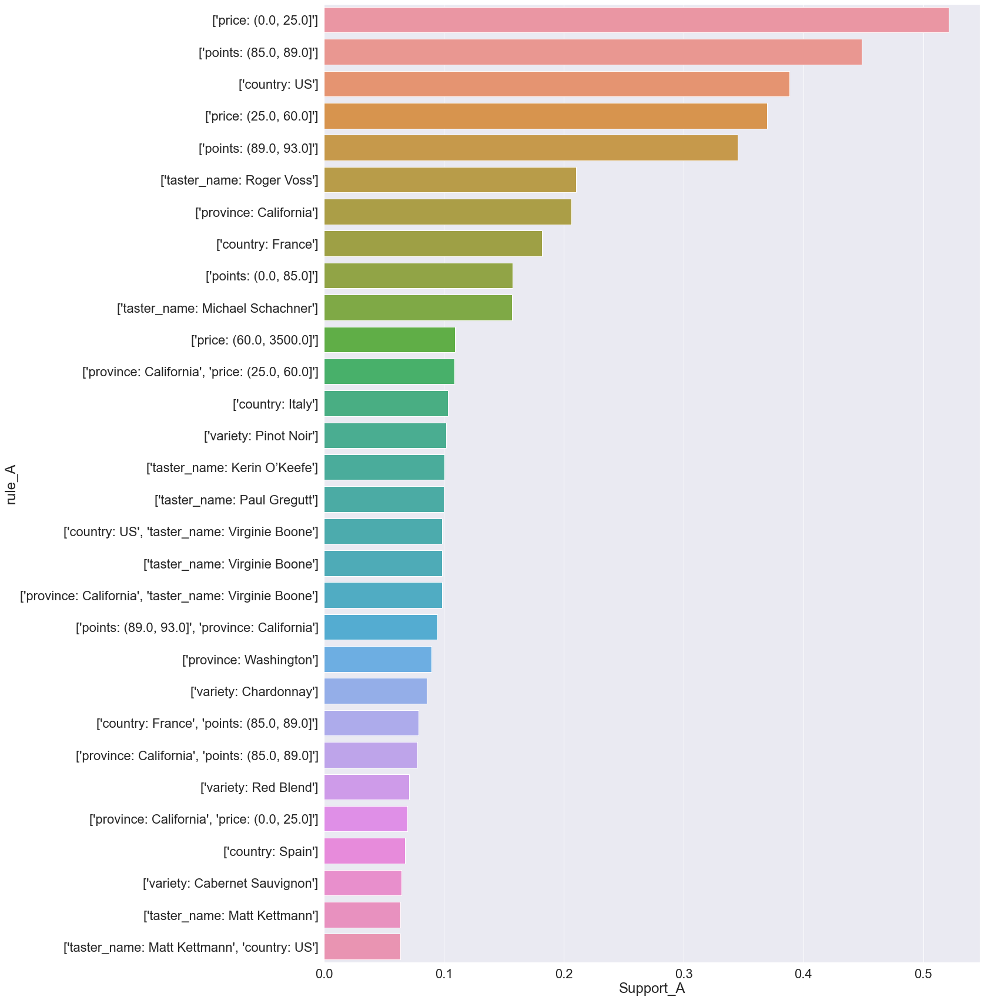

In [25]:
drawBarPlot(itemSet, ['rule_A', 'Support_A'], 'Support_A', 'rule_A', 'Support_A')

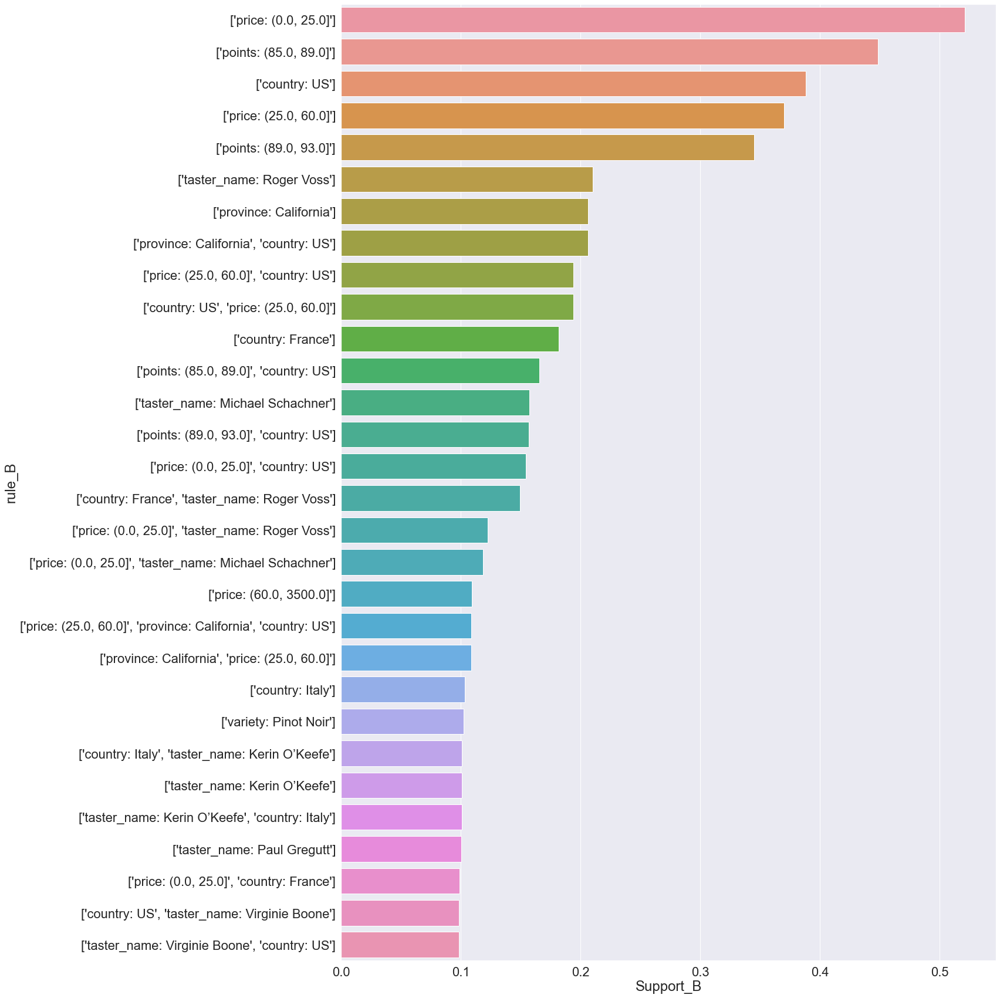

In [26]:
drawBarPlot(itemSet, ['rule_B', 'Support_B'], 'Support_B', 'rule_B', 'Support_B')

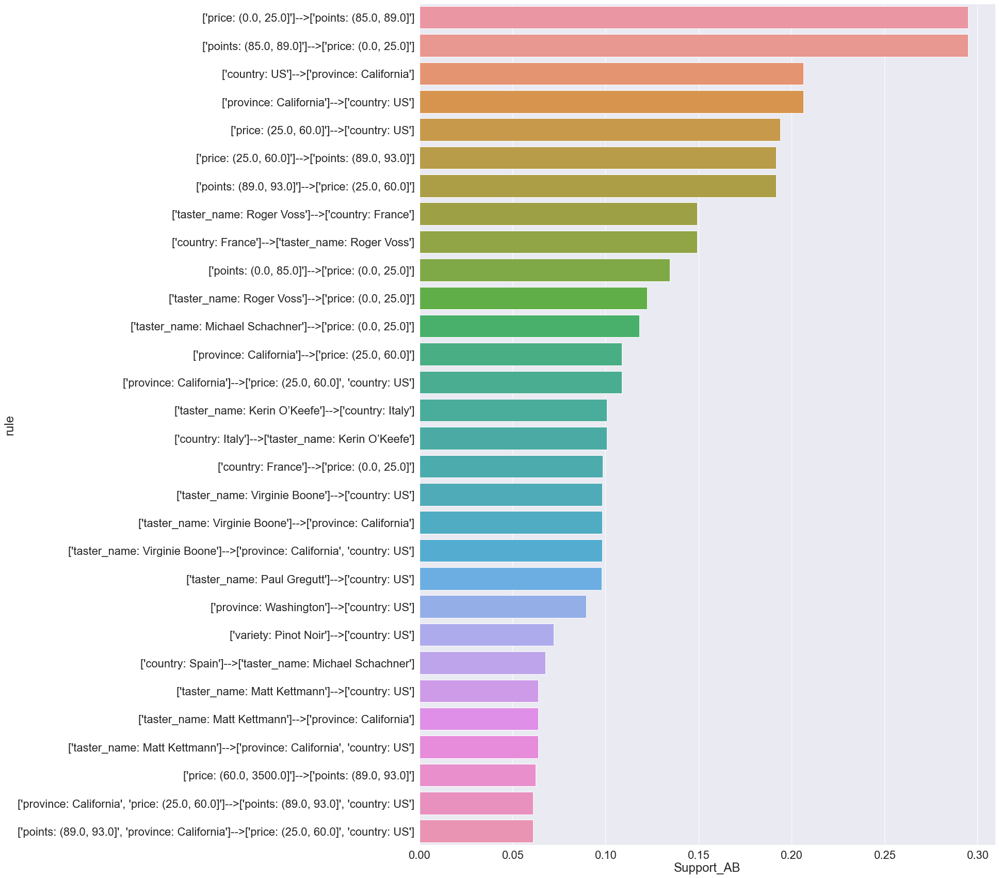

In [27]:
drawBarPlot(itemSet, ['rule', 'Support_AB'], 'Support_AB', 'rule', 'Support_AB')

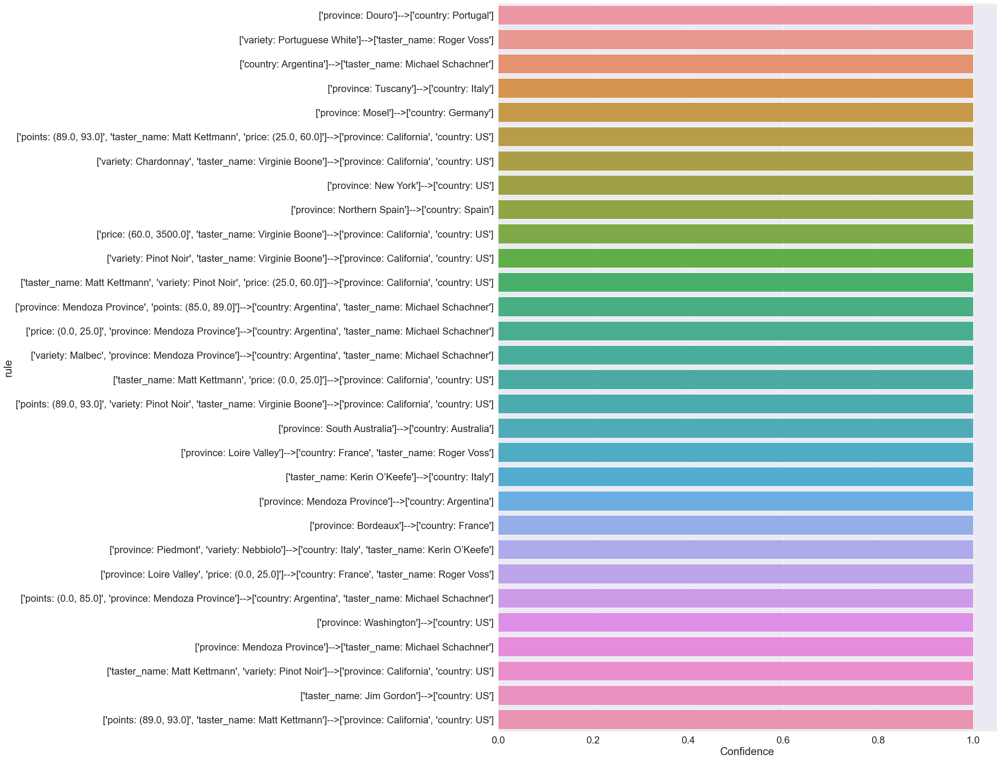

In [28]:
drawBarPlot(itemSet, ['rule', 'Confidence'], 'Confidence', 'rule', 'Confidence')

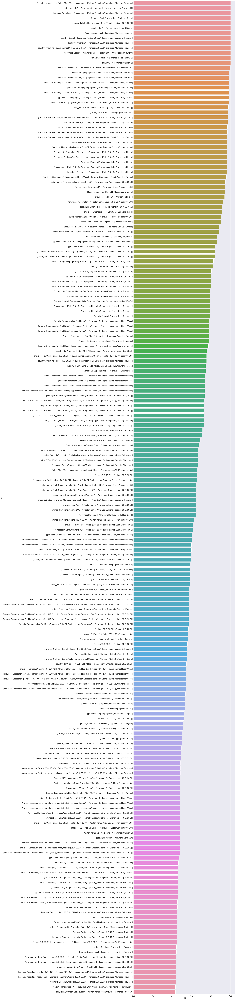

In [39]:
drawBarPlot(itemSet, ['rule', 'Lift'], 'Lift', 'rule', 'Lift', nums=200, fig_size=(20, 200))

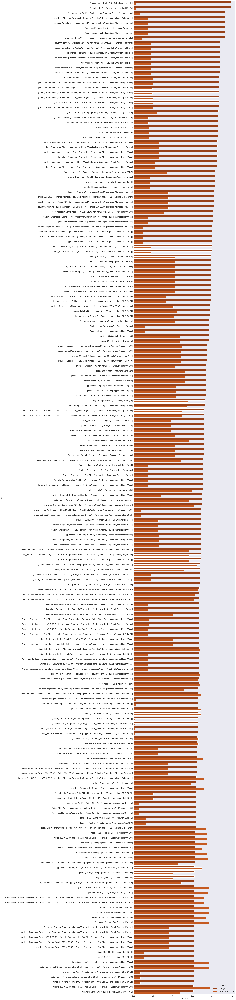

In [37]:
drawBarPlotMulti(itemSet, ['rule', 'Kulczynski', 'Imbalance_Ratio'], ['Kulczynski', 'Imbalance_Ratio'], 'rule', 'Kulczynski', nums=200, fig_size=(20, 200))